# Cсылка на архив с незаполненным семинаром, обучающей и валидационной выборкой и необходимыми для запуска файлами:
https://cloud.mail.ru/public/5Nyn/2nZFpoSJF

In [ ]:
!wget https://www.dropbox.com/s/9az39m4pbxc2ffm/model_state_dict_final.pth
!wget https://www.dropbox.com/s/c3fzzh4mh0s268g/number_plates.zip
!unzip number_plates.zip
!rm number_plates.zip

In [1]:
# uncomment this if you have cuda and want to specify the device
import os
os.environ["CUDA_VISIBLE_DEVICES"]="1"

In [2]:
import numpy as np
import cv2
import glob
import matplotlib
%matplotlib inline
import matplotlib.pyplot as plt
import tqdm
import seaborn as sns
import torchvision
import torch
import PIL
from PIL import Image
import json

def show_image(image, figsize=(16, 9), reverse=True):
    plt.figure(figsize=figsize)
    if reverse:
        plt.imshow(image[...,::-1])
    else:
        plt.imshow(image)
    plt.axis('off')
    plt.show()

def save_to_json(filename, data):
    with open(filename, 'w') as f:
        return json.dump(data, f)
    
def load_from_json(filename):
    with open(filename, 'r') as f:
        return json.load(f)

# Load COCO info

Useful links:
http://cocodataset.org/#home

In [3]:
coco_id_to_name = load_from_json("coco_id_to_name.json")

In [4]:
coco_id_to_name = {int(key): value for key, value in coco_id_to_name.items()}

In [5]:
coco_id_to_name

{1: 'person',
 2: 'bicycle',
 3: 'car',
 4: 'motorcycle',
 5: 'airplane',
 6: 'bus',
 7: 'train',
 8: 'truck',
 9: 'boat',
 10: 'traffic light',
 11: 'fire hydrant',
 13: 'stop sign',
 14: 'parking meter',
 15: 'bench',
 16: 'bird',
 17: 'cat',
 18: 'dog',
 19: 'horse',
 20: 'sheep',
 21: 'cow',
 22: 'elephant',
 23: 'bear',
 24: 'zebra',
 25: 'giraffe',
 27: 'backpack',
 28: 'umbrella',
 31: 'handbag',
 32: 'tie',
 33: 'suitcase',
 34: 'frisbee',
 35: 'skis',
 36: 'snowboard',
 37: 'sports ball',
 38: 'kite',
 39: 'baseball bat',
 40: 'baseball glove',
 41: 'skateboard',
 42: 'surfboard',
 43: 'tennis racket',
 44: 'bottle',
 46: 'wine glass',
 47: 'cup',
 48: 'fork',
 49: 'knife',
 50: 'spoon',
 51: 'bowl',
 52: 'banana',
 53: 'apple',
 54: 'sandwich',
 55: 'orange',
 56: 'broccoli',
 57: 'carrot',
 58: 'hot dog',
 59: 'pizza',
 60: 'donut',
 61: 'cake',
 62: 'chair',
 63: 'couch',
 64: 'potted plant',
 65: 'bed',
 67: 'dining table',
 70: 'toilet',
 72: 'tv',
 73: 'laptop',
 74: 'mo

In [6]:
len(coco_id_to_name)

80

In [7]:
list(coco_id_to_name.values())

['person',
 'bicycle',
 'car',
 'motorcycle',
 'airplane',
 'bus',
 'train',
 'truck',
 'boat',
 'traffic light',
 'fire hydrant',
 'stop sign',
 'parking meter',
 'bench',
 'bird',
 'cat',
 'dog',
 'horse',
 'sheep',
 'cow',
 'elephant',
 'bear',
 'zebra',
 'giraffe',
 'backpack',
 'umbrella',
 'handbag',
 'tie',
 'suitcase',
 'frisbee',
 'skis',
 'snowboard',
 'sports ball',
 'kite',
 'baseball bat',
 'baseball glove',
 'skateboard',
 'surfboard',
 'tennis racket',
 'bottle',
 'wine glass',
 'cup',
 'fork',
 'knife',
 'spoon',
 'bowl',
 'banana',
 'apple',
 'sandwich',
 'orange',
 'broccoli',
 'carrot',
 'hot dog',
 'pizza',
 'donut',
 'cake',
 'chair',
 'couch',
 'potted plant',
 'bed',
 'dining table',
 'toilet',
 'tv',
 'laptop',
 'mouse',
 'remote',
 'keyboard',
 'cell phone',
 'microwave',
 'oven',
 'toaster',
 'sink',
 'refrigerator',
 'book',
 'clock',
 'vase',
 'scissors',
 'teddy bear',
 'hair drier',
 'toothbrush']

# Sample run

In [8]:
file = 'detection_examples/mrs_maisel.jpg'

https://github.com/pytorch/vision/blob/c732dfe2a4b1c861d8d1fedd7999f473f8cd3142/torchvision/models/detection/faster_rcnn.py#L24

In [9]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True, progress=True,
                            num_classes=91, pretrained_backbone=True)

In [10]:
from torchvision import transforms

to_tensor = transforms.ToTensor()

def val_transform(img):
    img_tensor = to_tensor(img)
    return img_tensor.unsqueeze(0)

def visualize_prediction(file, model, device='cuda', verbose=True, thresh=0.0, n_colors=None):
    img = Image.open(file)
    img_tensor = val_transform(img)
    model.to(device)
    model.eval()
    with torch.no_grad():
        predictions = model(img_tensor.to(device)) # list of size 1
    prediction = predictions[0]
    
    if n_colors is None:
        n_colors = model.roi_heads.box_predictor.cls_score.out_features
    
    palette = sns.color_palette(None, n_colors)
    
    # visualize
    img = cv2.imread(file, cv2.COLOR_BGR2RGB)
    for i in range(len(prediction['boxes'])):
        x1, x2, x3, x4 = map(int, prediction['boxes'][i].tolist())
        label = int(prediction['labels'][i].cpu())
        score = float(prediction['scores'][i].cpu())
        name = coco_id_to_name[label]
        color = palette[label]
        if verbose:
            if score > thresh:
                print ('Class: {}, Confidence: {}'.format(name, score))
        if score > thresh:
            image = cv2.rectangle(img, (x1, x2), (x3, x4), np.array(color) * 255, 2)
            cv2.putText(image, name, (x1, x2-10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, np.array(color) * 255, 2)
    show_image(image)
    return prediction

In [11]:
file

'detection_examples/mrs_maisel.jpg'

In [12]:
img = Image.open(file)

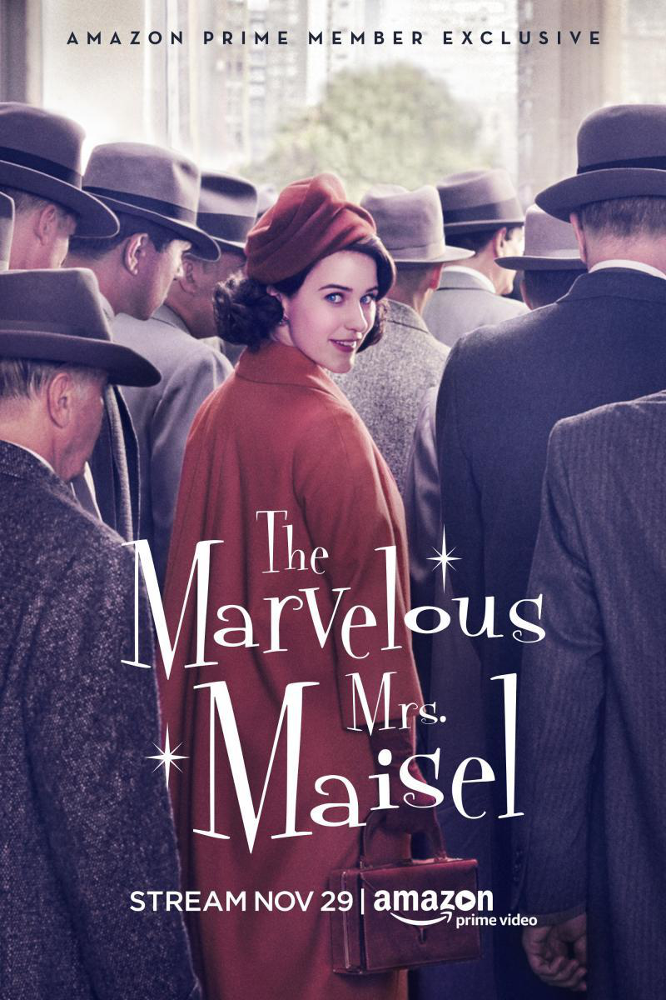

In [13]:
img

Class: person, Confidence: 0.9956188797950745
Class: person, Confidence: 0.9719012379646301
Class: person, Confidence: 0.9708347320556641
Class: person, Confidence: 0.9520890116691589
Class: person, Confidence: 0.9492106437683105
Class: person, Confidence: 0.9448843598365784
Class: person, Confidence: 0.925794780254364
Class: person, Confidence: 0.8480136394500732
Class: person, Confidence: 0.7299481630325317
Class: person, Confidence: 0.6387625336647034
Class: tie, Confidence: 0.5950103998184204
Class: person, Confidence: 0.4871276915073395
Class: person, Confidence: 0.4335247576236725
Class: chair, Confidence: 0.402619868516922
Class: person, Confidence: 0.39921143651008606
Class: person, Confidence: 0.39902275800704956
Class: person, Confidence: 0.3596387803554535
Class: person, Confidence: 0.31510254740715027
Class: person, Confidence: 0.3116178512573242
Class: person, Confidence: 0.30801910161972046
Class: person, Confidence: 0.27895721793174744
Class: person, Confidence: 0.261349

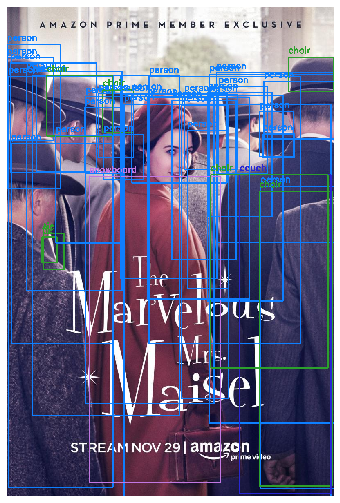

In [14]:
out = visualize_prediction(file, model)

Class: person, Confidence: 0.9956188797950745
Class: person, Confidence: 0.9719012379646301
Class: person, Confidence: 0.9708347320556641
Class: person, Confidence: 0.9520890116691589
Class: person, Confidence: 0.9492106437683105
Class: person, Confidence: 0.9448843598365784
Class: person, Confidence: 0.925794780254364
Class: person, Confidence: 0.8480136394500732


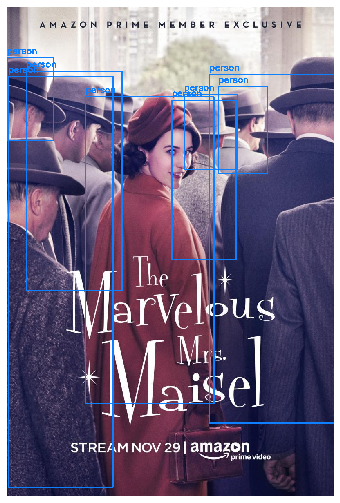

In [15]:
out = visualize_prediction(file, model, thresh=0.8)

# Еще один пример

In [16]:
file = 'detection_examples/junk_food.jpg'

Class: person, Confidence: 0.9768175482749939
Class: person, Confidence: 0.9621939659118652
Class: person, Confidence: 0.9575483202934265
Class: person, Confidence: 0.9556088447570801
Class: person, Confidence: 0.8266396522521973
Class: sandwich, Confidence: 0.8228334784507751
Class: hot dog, Confidence: 0.8058623671531677
Class: person, Confidence: 0.5006354451179504
Class: sandwich, Confidence: 0.4936721920967102
Class: person, Confidence: 0.4863065481185913
Class: bowl, Confidence: 0.4468253552913666
Class: person, Confidence: 0.4429800808429718
Class: cake, Confidence: 0.2984040081501007
Class: sandwich, Confidence: 0.2689817249774933
Class: cup, Confidence: 0.24261289834976196
Class: person, Confidence: 0.22883693873882294
Class: dining table, Confidence: 0.2124602049589157
Class: cell phone, Confidence: 0.2023978978395462
Class: person, Confidence: 0.17625769972801208
Class: cell phone, Confidence: 0.1737309694290161
Class: sandwich, Confidence: 0.1665099561214447
Class: hot dog,

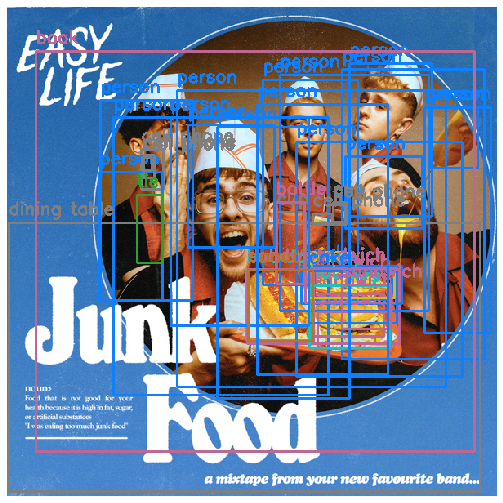

In [17]:
out = visualize_prediction(file, model)

Class: person, Confidence: 0.9768175482749939
Class: person, Confidence: 0.9621939659118652
Class: person, Confidence: 0.9575483202934265
Class: person, Confidence: 0.9556088447570801
Class: person, Confidence: 0.8266396522521973
Class: sandwich, Confidence: 0.8228334784507751
Class: hot dog, Confidence: 0.8058623671531677


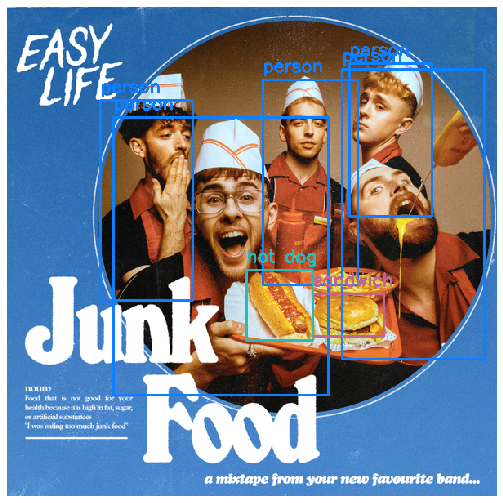

In [18]:
out = visualize_prediction(file, model, thresh=0.8)

Class: person, Confidence: 0.9768175482749939
Class: person, Confidence: 0.9621939659118652
Class: person, Confidence: 0.9575483202934265
Class: person, Confidence: 0.9556088447570801
Class: person, Confidence: 0.8266396522521973
Class: sandwich, Confidence: 0.8228334784507751
Class: hot dog, Confidence: 0.8058623671531677
Class: person, Confidence: 0.5006354451179504
Class: sandwich, Confidence: 0.4936721920967102
Class: person, Confidence: 0.4863065481185913
Class: bowl, Confidence: 0.4468253552913666
Class: person, Confidence: 0.4429800808429718


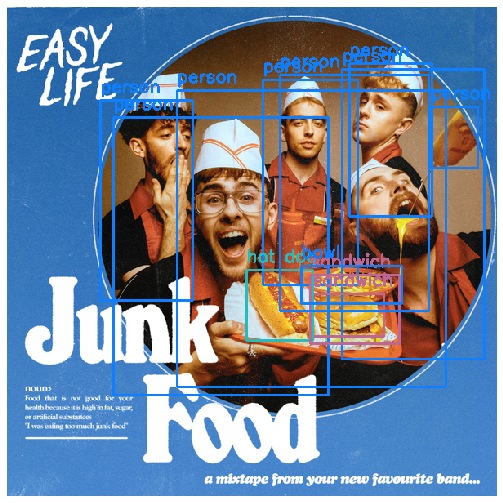

In [19]:
out = visualize_prediction(file, model, thresh=0.4)

In [20]:
list(coco_id_to_name.values())

['person',
 'bicycle',
 'car',
 'motorcycle',
 'airplane',
 'bus',
 'train',
 'truck',
 'boat',
 'traffic light',
 'fire hydrant',
 'stop sign',
 'parking meter',
 'bench',
 'bird',
 'cat',
 'dog',
 'horse',
 'sheep',
 'cow',
 'elephant',
 'bear',
 'zebra',
 'giraffe',
 'backpack',
 'umbrella',
 'handbag',
 'tie',
 'suitcase',
 'frisbee',
 'skis',
 'snowboard',
 'sports ball',
 'kite',
 'baseball bat',
 'baseball glove',
 'skateboard',
 'surfboard',
 'tennis racket',
 'bottle',
 'wine glass',
 'cup',
 'fork',
 'knife',
 'spoon',
 'bowl',
 'banana',
 'apple',
 'sandwich',
 'orange',
 'broccoli',
 'carrot',
 'hot dog',
 'pizza',
 'donut',
 'cake',
 'chair',
 'couch',
 'potted plant',
 'bed',
 'dining table',
 'toilet',
 'tv',
 'laptop',
 'mouse',
 'remote',
 'keyboard',
 'cell phone',
 'microwave',
 'oven',
 'toaster',
 'sink',
 'refrigerator',
 'book',
 'clock',
 'vase',
 'scissors',
 'teddy bear',
 'hair drier',
 'toothbrush']

# Давайте дообучимся на что-нибудь новое: номерные знаки

### Датасет Open images:
https://storage.googleapis.com/openimages/web/index.html

In [21]:
filename_to_bbox_train_dict = load_from_json('filename_to_bbox_train.json')

In [22]:
filename_to_bbox_val_dict = load_from_json('filename_to_bbox_val.json')

In [23]:
len(filename_to_bbox_train_dict), len(filename_to_bbox_val_dict)

(1313, 200)

# Визуализируем датасет

In [24]:
def visualize_from_dataset(file, filename_to_bbox_dict):
    img = cv2.imread(file, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]
    for i in range(len(filename_to_bbox_dict[file])):
        x_min, x_max, y_min, y_max = filename_to_bbox_dict[file][i]
        x_min, y_min, x_max, y_max = int(x_min * w), int(y_min * h), int(x_max * w), int(y_max * h)
        image = cv2.rectangle(img, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
    show_image(image)

In [25]:
train_filenames = list(filename_to_bbox_train_dict.keys())

In [26]:
train_filenames[0]

'./number_plates/00200.jpg'

In [28]:
filename_to_bbox_train_dict[train_filenames[0]]

[[0.445, 0.51375, 0.755833, 0.786667], [0.62375, 0.678125, 0.753333, 0.779167]]

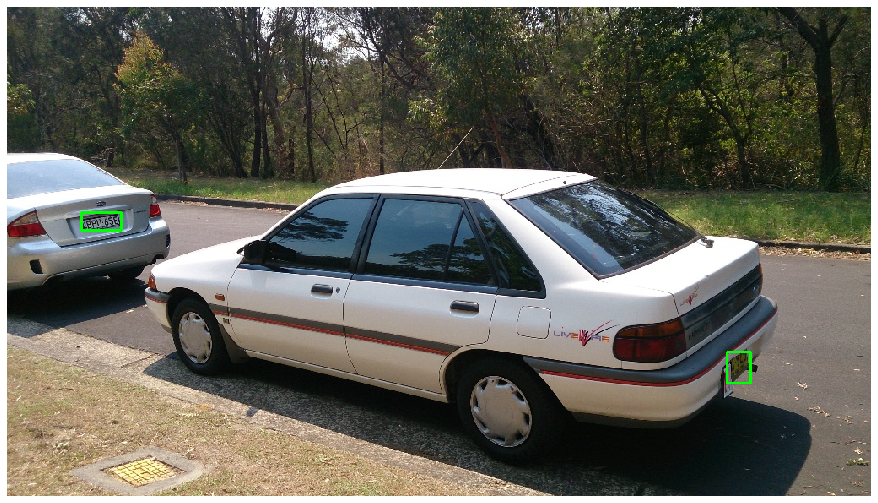

In [30]:
filename = np.random.choice(train_filenames)
visualize_from_dataset(filename, filename_to_bbox_train_dict)

In [31]:
val_filenames = list(filename_to_bbox_val_dict.keys())

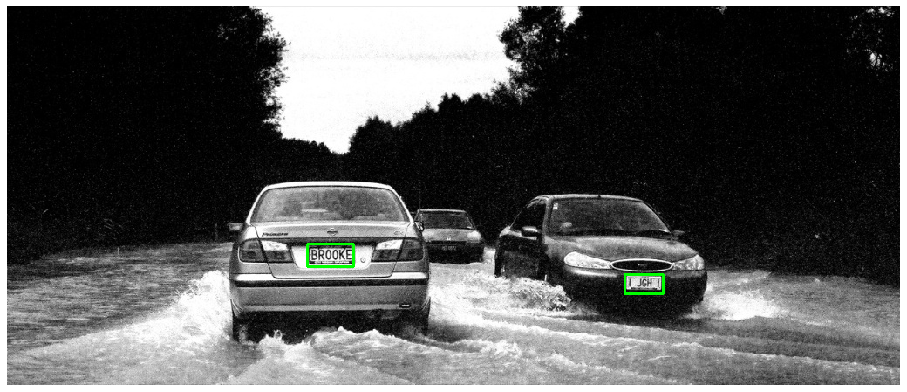

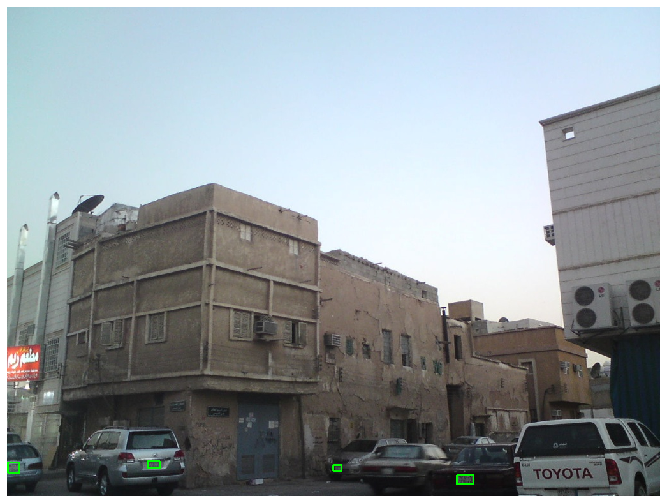

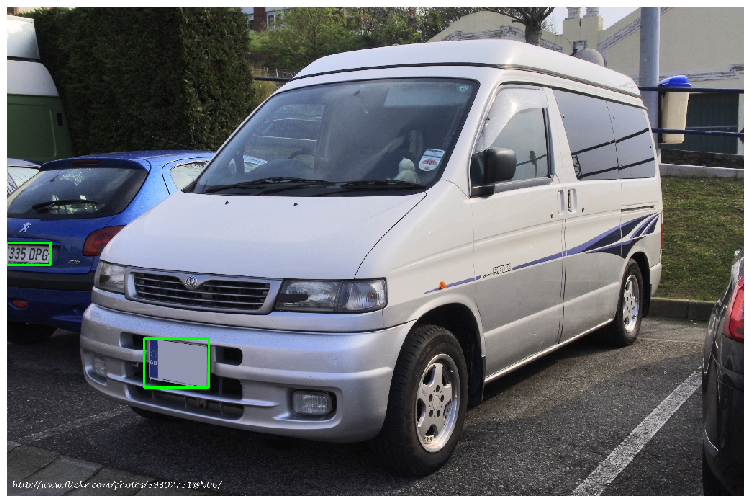

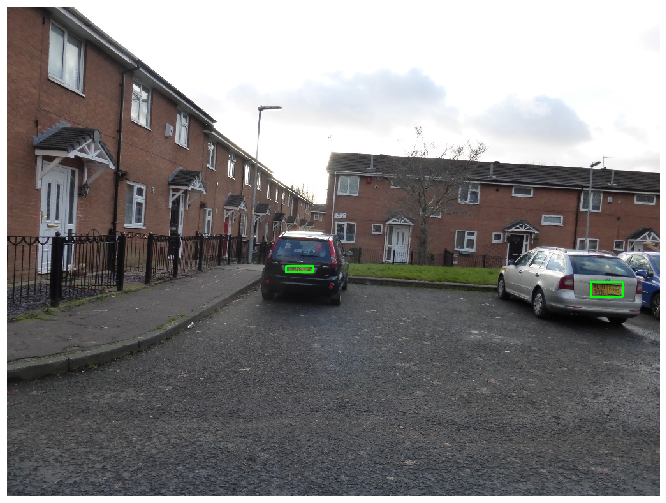

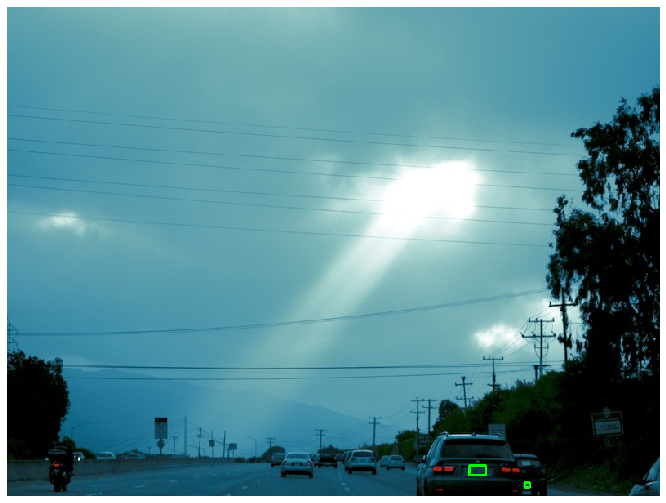

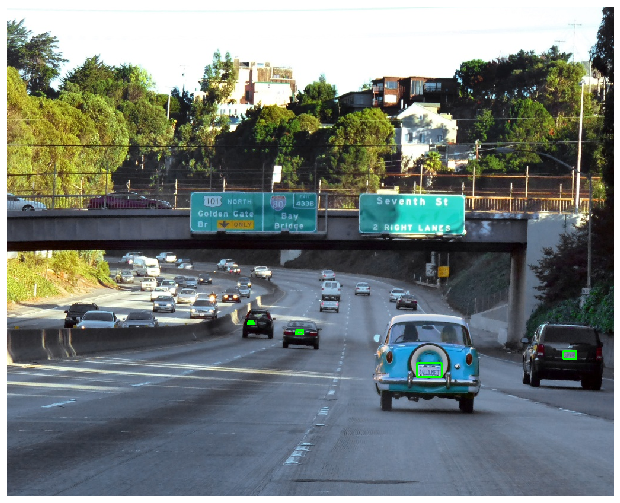

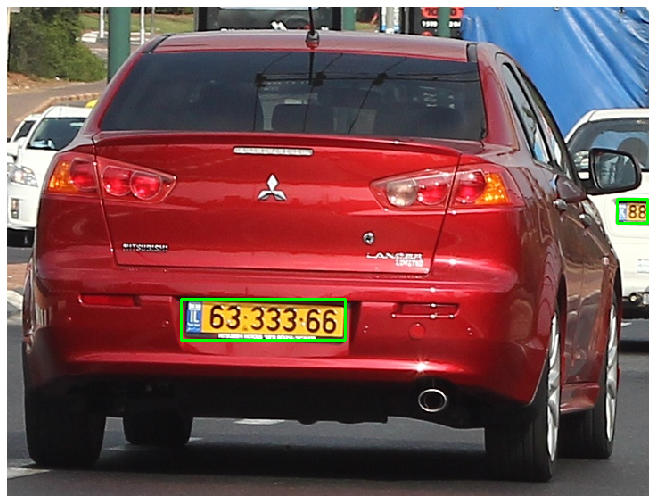

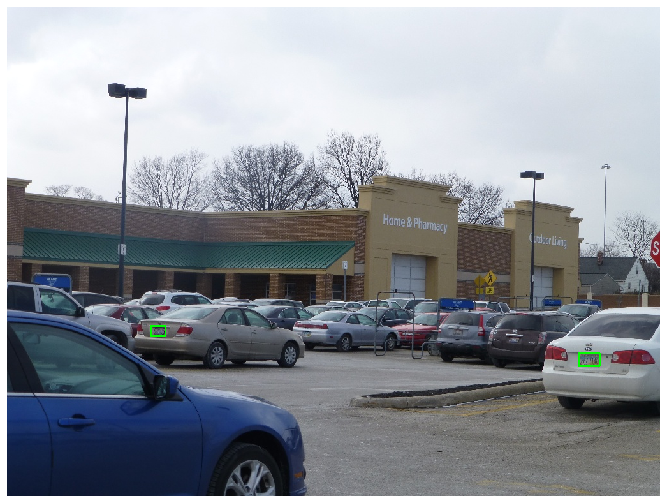

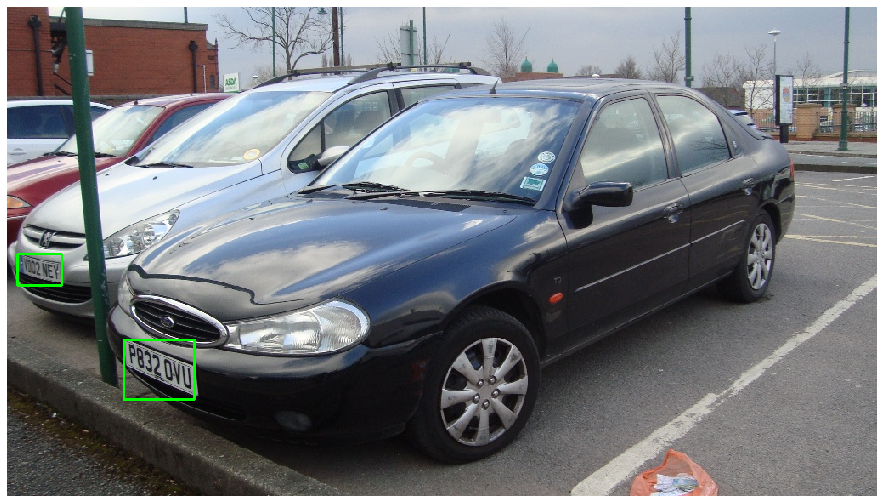

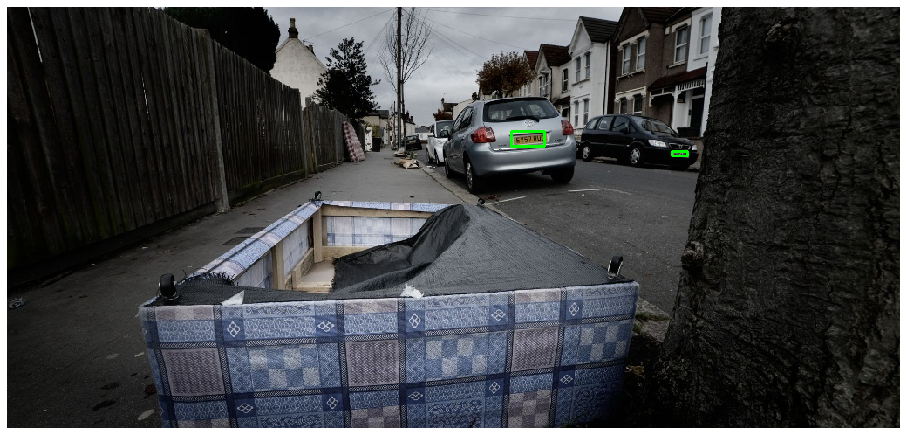

In [32]:
for filename in np.random.choice(val_filenames, 10):
    visualize_from_dataset(filename, filename_to_bbox_val_dict)

# Создадим класс датасета

In [33]:
import os
import numpy as np
import torch
import torch.utils.data
from PIL import Image
import json
from torchvision import transforms

class DetectionDataset(torch.utils.data.Dataset):
    def __init__(self, data_dict_file, transforms=None):
        self.transforms = transforms
        
        with open(data_dict_file, 'r') as f:
            self.data_dict = json.load(f)
        
        self.imgs = list(self.data_dict.keys())
        
    def __getitem__(self, idx):
        # load images ad masks
        img_path = self.imgs[idx]
        img = Image.open(img_path).convert("RGB")
        w, h = img.size

        num_objs = len(self.data_dict[img_path])
        boxes = []
        for i in range(num_objs):
            bbox = self.data_dict[img_path][i]
            xmin = bbox[0] * w
            xmax = bbox[1] * w
            ymin = bbox[2] * h
            ymax = bbox[3] * h
            boxes.append([xmin, ymin, xmax, ymax])

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # there is only one class
        labels = torch.ones((num_objs,), dtype=torch.int64)
        
        # is crowd
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd

        if self.transforms is not None:
            img = self.transforms(img)

        return img, target
    
    def __len__(self):
        return len(self.imgs)

# Create transforms

In [34]:
img_transforms = transforms.Compose([
    transforms.ToTensor()
])

# Load datasets

In [35]:
# collate_fn needs for batch
def collate_fn(batch):
    return tuple(zip(*batch))

In [36]:
# use our dataset and defined transformations
train_dataset = DetectionDataset('filename_to_bbox_train.json', img_transforms)
val_dataset = DetectionDataset('filename_to_bbox_val.json', img_transforms)

# Make dataloaders

In [2]:
# define training and validation data loaders
data_loader = torch.utils.data.DataLoader(
    train_dataset, batch_size=4, shuffle=True, num_workers=4,
    collate_fn=collate_fn, drop_last=True)

data_loader_val = torch.utils.data.DataLoader(
    val_dataset, batch_size=4, shuffle=False, num_workers=1,
    collate_fn=collate_fn, drop_last=False)

# Load model

In [38]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True, pretrained_backbone=True)

In [39]:
model

FasterRCNN(
  (transform): GeneralizedRCNNTransform()
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d()
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d()
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d()
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d()
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d()
          )
  

In [46]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
# load a model pre-trained pre-trained on COCO
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True, pretrained_backbone=True)

# поменяйте модель так, чтобы она правильно работала с новой задачей
num_classes = 2
in_features = model.roi_heads.box_predictor.cls_score.in_features

model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

In [47]:
assert model.roi_heads.box_predictor.cls_score.in_features == 1024
assert model.roi_heads.box_predictor.cls_score.out_features == 2
assert model.roi_heads.box_predictor.bbox_pred.out_features == 8

# Включить обучение только region-proposal сети и головы

In [48]:
model

FasterRCNN(
  (transform): GeneralizedRCNNTransform()
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d()
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d()
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d()
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d()
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d()
          )
  

In [50]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# move model to the right device
model.to(device)

# сделайте так, чтобы мы обучали только нужные части сети
for param in model.parameters():
    param.requires_grad = False
    
for param in model.rpn.parameters():
    param.requires_grad = True
    
for param in model.roi_heads.parameters():
    param.requires_grad = True

# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                            momentum=0.9, weight_decay=0.0005)

In [51]:
len(params)

14

In [52]:
# and a learning rate scheduler which decreases the learning rate by
# 10x every 30 epochs
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=30,
                                               gamma=0.1)

# Обучение 

In [53]:
from engine import evaluate

In [55]:
import math
import sys
import time
import torch

from coco_utils import get_coco_api_from_dataset
from coco_eval import CocoEvaluator
import utils

def train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq):
    model.train()
    metric_logger = utils.MetricLogger(delimiter="  ")
    metric_logger.add_meter('lr', utils.SmoothedValue(window_size=1, fmt='{value:.6f}'))
    header = 'Epoch: [{}]'.format(epoch)

    lr_scheduler = None
    if epoch == 0:
        warmup_factor = 1. / 1000
        warmup_iters = min(1000, len(data_loader) - 1)

        lr_scheduler = utils.warmup_lr_scheduler(optimizer, warmup_iters, warmup_factor)

    for images, targets in metric_logger.log_every(data_loader, print_freq, header):
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # получим предсказания сети (словарь)
        # cложим их
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()

        if not math.isfinite(loss_value):
            print("Loss is {}, stopping training".format(loss_value))
            print(loss_dict_reduced)
            sys.exit(1)

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        if lr_scheduler is not None:
            lr_scheduler.step()

        metric_logger.update(loss=losses, **loss_dict)
        metric_logger.update(lr=optimizer.param_groups[0]["lr"])

# Запустим обучение

In [56]:
num_epochs=100
for epoch in range(num_epochs):
    train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=50)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    evaluate(model, data_loader_val, device=device)
    torch.save(model.state_dict(), 'model_state_dict_last.pth')

Epoch: [0]  [  0/328]  eta: 0:05:30  lr: 0.000020  loss: 2.3637 (2.3637)  loss_classifier: 0.8966 (0.8966)  loss_box_reg: 0.0022 (0.0022)  loss_objectness: 1.2628 (1.2628)  loss_rpn_box_reg: 0.2021 (0.2021)  time: 1.0071  data: 0.5488  max mem: 1646
Epoch: [0]  [ 50/328]  eta: 0:01:28  lr: 0.000784  loss: 0.5720 (0.9430)  loss_classifier: 0.0902 (0.2420)  loss_box_reg: 0.0192 (0.0170)  loss_objectness: 0.2116 (0.5310)  loss_rpn_box_reg: 0.1076 (0.1530)  time: 0.3075  data: 0.0138  max mem: 3048
Epoch: [0]  [100/328]  eta: 0:01:10  lr: 0.001548  loss: 0.2608 (0.6451)  loss_classifier: 0.0723 (0.1646)  loss_box_reg: 0.0484 (0.0313)  loss_objectness: 0.0763 (0.3252)  loss_rpn_box_reg: 0.0582 (0.1241)  time: 0.3073  data: 0.0129  max mem: 3048
Epoch: [0]  [150/328]  eta: 0:00:54  lr: 0.002312  loss: 0.2485 (0.5195)  loss_classifier: 0.0588 (0.1314)  loss_box_reg: 0.0497 (0.0383)  loss_objectness: 0.0611 (0.2430)  loss_rpn_box_reg: 0.0584 (0.1068)  time: 0.3091  data: 0.0129  max mem: 3048


Epoch: [2]  [250/328]  eta: 0:00:24  lr: 0.005000  loss: 0.1781 (0.1925)  loss_classifier: 0.0532 (0.0582)  loss_box_reg: 0.0465 (0.0500)  loss_objectness: 0.0227 (0.0300)  loss_rpn_box_reg: 0.0440 (0.0543)  time: 0.3128  data: 0.0134  max mem: 3048
Epoch: [2]  [300/328]  eta: 0:00:08  lr: 0.005000  loss: 0.1533 (0.1929)  loss_classifier: 0.0514 (0.0578)  loss_box_reg: 0.0455 (0.0500)  loss_objectness: 0.0240 (0.0298)  loss_rpn_box_reg: 0.0364 (0.0553)  time: 0.3189  data: 0.0134  max mem: 3048
Epoch: [2]  [327/328]  eta: 0:00:00  lr: 0.005000  loss: 0.2049 (0.1948)  loss_classifier: 0.0593 (0.0579)  loss_box_reg: 0.0506 (0.0502)  loss_objectness: 0.0274 (0.0299)  loss_rpn_box_reg: 0.0666 (0.0568)  time: 0.3123  data: 0.0122  max mem: 3048
Epoch: [2] Total time: 0:01:41 (0.3089 s / it)
creating index...
index created!
Test:  [ 0/50]  eta: 0:00:26  model_time: 0.2127 (0.2127)  evaluator_time: 0.0071 (0.0071)  time: 0.5297  data: 0.2981  max mem: 3048
Test:  [49/50]  eta: 0:00:00  model_

KeyboardInterrupt: 

## Сохраним модель

In [ ]:
torch.save(model.state_dict(), 'model_state_dict_workshop_final.pth')

# Загрузим сохраненную модель

In [ ]:
model.load_state_dict(torch.load('model_state_dict_final.pth'))

In [ ]:
model.to(device)

In [ ]:
evaluate(model, data_loader_val, device=device)

# Визуализируем предсказания для валидации

In [57]:
def visualize_prediction_plate(file, model, device='cuda', verbose=True, thresh=0.0, 
                               n_colors=None, id_to_name=None):
    img = Image.open(file)
    img_tensor = val_transform(img)
    model.to(device)
    model.eval()
    with torch.no_grad():
        predictions = model(img_tensor.to(device)) # list of size 1
    prediction = predictions[0]
    
    if n_colors is None:
        n_colors = model.roi_heads.box_predictor.cls_score.out_features
    
    palette = sns.color_palette(None, n_colors)
    
    # visualize
    img = cv2.imread(file, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]
    image = img
    for i in range(len(prediction['boxes'])):
        x_min, y_min, x_max, y_max = map(int, prediction['boxes'][i].tolist())
        label = int(prediction['labels'][i].cpu())
        score = float(prediction['scores'][i].cpu())
        name = id_to_name[label]
        color = palette[label]
        if verbose:
            if score > thresh:
                print ('Class: {}, Confidence: {}'.format(name, score))
        if score > thresh:
            image = cv2.rectangle(img, (x_min, y_min), (x_max, y_max), np.array(color) * 255, 2)
            cv2.putText(image, name, (x_min, y_min-10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, np.array(color) * 255, 2)
    show_image(image)
    return prediction

# Визуализируем предсказания

In [58]:
val_filenames = list(filename_to_bbox_val_dict.keys())

In [59]:
len(val_filenames)

200

In [70]:
#filename = '/data2/OI5/train/17640718_5d07988f5a_o.jpg'
filename = np.random.choice(val_filenames)

Class: plate, Confidence: 0.9775582551956177
Class: plate, Confidence: 0.9517622590065002


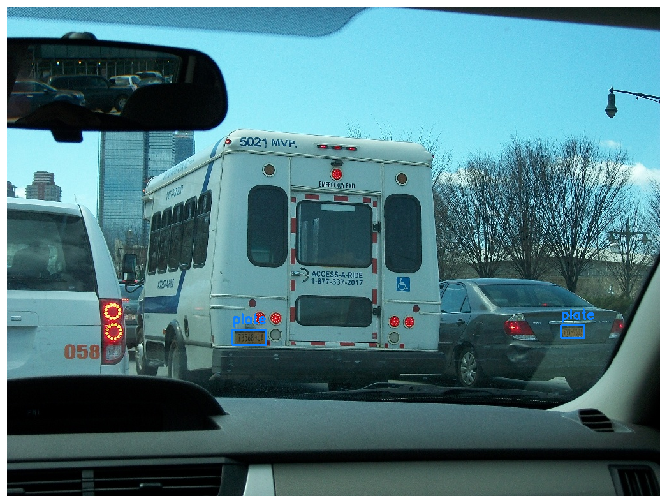

{'boxes': tensor([[ 868.0917,  500.7053,  905.4838,  520.8012],
         [ 353.5850,  507.3642,  406.7459,  531.3723],
         [  87.2286,  524.4083,  142.5963,  558.9417],
         [ 942.9408,  718.9457, 1016.0476,  768.0000],
         [ 456.3982,  412.0817,  565.5555,  440.9790]], device='cuda:0'),
 'labels': tensor([1, 1, 1, 1, 1], device='cuda:0'),
 'scores': tensor([0.9776, 0.9518, 0.4104, 0.2816, 0.0674], device='cuda:0')}

In [77]:
filename = np.random.choice(val_filenames)
visualize_prediction_plate(filename, model, id_to_name={1: 'plate'}, thresh=0.5)

# Полезные ссылки

На следующем занятии вы поговорите про сегментацию. Модели для детекции могут быть дообучены для сегментации.
Пример: https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html#

## Репозиторий с детектором от Facebook AI Research:
https://github.com/facebookresearch/detectron2